In [ ]:
# Import or install Sionna
try:
    import sionna.rt
except ImportError as e:
    import os
    os.system("pip install sionna-rt")
    import sionna.rt

# Other imports
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import drjit as dr 
import mitsuba as mi

no_preview = False # Toggle to False to use the preview widget


%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
    
from sionna.rt import load_scene, PlanarArray, Transmitter, Receiver, ITURadioMaterial,\
    Camera, PathSolver, InteractionType, RadioMapSolver
from sionna.rt.utils import r_hat

장면 로딩 및 객체 병합

In [3]:
from sionna.rt.scene import load_scene

scene = load_scene("/data1/mh/sionna/src/sionna/rt/scenes/kookmin/kookmin_itu.xml")
#cam = Camera(position=[0, 600, -2000], look_at=[0, 0, 0])
cam = Camera(position=[0, 200, -1000], look_at=[0, 0, 0])
if no_preview:
    scene.render(camera=cam);
else:
    scene.preview();


In [4]:
for name, obj in scene.objects.items():
    print(f'{name:<15}{obj.radio_material.name}')

elm__23        wall
elm__24        roof
elm__25        8b4513
elm__26        2f4f4f
elm__27        red
elm__28        white
elm__29        gray
elm__30        black
elm__31        darkgrey
elm__32        grey
elm__33        lightgrey
elm__34        silver
elm__35        brown
elm__36        d2aa6d
elm__37        a58e9a
elm__38        ffe0a0
elm__39        dda088
elm__40        f4a460
elm__41        green
elm__42        696969
elm__43        f4e1c3
elm__44        5a564b
elm__89        itu_concrete
elm__54        forest
elm__50        water
elm__00        roads_primary
elm__48        vegetation
elm__52        areas_pedestrian
elm__46        areas_railways


In [5]:
import mitsuba as mi
import drjit as dr
from sionna.rt import load_scene, Camera
from sionna.rt import ITURadioMaterial

# 1. 장면 로드
scene = load_scene("/data1/mh/sionna/src/sionna/rt/scenes/kookmin/kookmin_itu.xml")

target_id = "elm__00"

if target_id in scene.objects:
    # [수정] thickness 매개변수 추가 (예: 0.2 미터)
    red_road_mat = ITURadioMaterial(name="red_road_mat",
                                    itu_type="concrete",
                                    thickness=2,  # <--- 이 부분을 추가하세요
                                    color=[1.0, 0.0, 0.0]) 
    
    # 3. 씬에 재질 등록
    scene.add(red_road_mat)
    
    # 4. 도로 객체에 새 재질 할당
    scene.objects[target_id].radio_material = "red_road_mat"
    
    print(f"[성공] '{target_id}'에 빨간색 재질(두께 0.2m)을 적용했습니다.")
else:
    print(f"[실패] '{target_id}' 객체를 찾을 수 없습니다.")

# 5. 시각화
cam = Camera(position=[0, 200, 1000], look_at=[0, 0, 0])

try:
    if 'no_preview' in globals() and no_preview:
        print("Preview skipped.")
    else:
        scene.preview()
except:
    scene.preview()

[성공] 'elm__00'에 빨간색 재질(두께 0.2m)을 적용했습니다.


'elm__00' (도로) 객체에서 좌표 추출

In [6]:
road_object_id = "elm__00"
road_positions = []

print(f"[탐색] Mitsuba Scene 내부에서 '{road_object_id}' 형상을 찾습니다...")

if hasattr(scene, 'mi_scene'):
    mi_scene = scene.mi_scene
    
    # 1. Mitsuba Scene의 모든 Shape를 순회하며 ID 매칭
    target_shape = None
    for s in mi_scene.shapes():
        if s.id() == road_object_id:
            target_shape = s
            break
    
    if target_shape: 
        try:           
            params = mi.traverse(target_shape)
                        
            if 'vertex_positions' in params:
                vertex_buffer = params['vertex_positions']
                
                # NumPy 변환 (1차원 배열: x, y, z, x, y, z ...)
                vertices_flat = np.array(vertex_buffer)
                
                # (N, 3) 형태로 변환 (x, y, z)
                if len(vertices_flat) > 0:
                    vertices = vertices_flat.reshape(-1, 3)
                    road_positions = vertices
                    print(f"  -> 추출된 도로 좌표 수: {len(road_positions)}개")
                else:
                    print("  [경고] 버퍼가 비어있습니다.")
            else:
                print(f"[오류] '{road_object_id}' 객체에 'vertex_positions' 속성이 없습니다.")

        except Exception as e:
            print(f"[오류] Vertex 추출 중 에러 발생: {e}")
    else:
        print(f"[실패] ID가 '{road_object_id}'인 Shape를 mi_scene에서 찾을 수 없습니다.")
else:
    print("[오류] scene 객체에서 'mi_scene' 속성을 찾을 수 없습니다.")

[탐색] Mitsuba Scene 내부에서 'elm__00' 형상을 찾습니다...
  -> 추출된 도로 좌표 수: 610개


V2X 차량 배치 (송신기 1대, 나머지 수신기)

In [7]:
if len(road_positions) > 0:
    # (1) 안테나 스펙 정의 (모든 차량 공통)
    # V2X용 단일 안테나 (1x1), 등방성 패턴(iso), 수직 편파(V)
    # 송신기용 안테나
    scene.tx_array = PlanarArray(num_rows=1, num_cols=1, pattern="iso", polarization="V")
    # 수신기용 안테나 (송신기와 동일하게 설정)
    scene.rx_array = PlanarArray(num_rows=1, num_cols=1, pattern="iso", polarization="V")

    # (2) 차량 위치 , 크기 선정
    num_cars = 20       #차량 대수
    vis_radius = 10.0    #차량 크기
    
    # 좌표가 부족할 경우를 대비한 안전장치
    if len(road_positions) < num_cars:
        print("좌표가 부족하여 중복을 허용합니다.")
        selected_indices = np.random.choice(len(road_positions), num_cars, replace=True)
    else:
        selected_indices = np.random.choice(len(road_positions), num_cars, replace=False)
        
    car_positions = road_positions[selected_indices]

    print(f"\n[V2X 배치] 총 {num_cars}대의 차량을 배치합니다.")
    print("  - 차량 1 (Index 0): 송신 차량 (Tx)")
    print(f"  - 차량 2~{num_cars}: 수신 차량 (Rx)")

# (3) 송신기/수신기 배치 루프
    for i, pos in enumerate(car_positions):
        # [수정] NumPy float32 -> Python float 변환
        # pos가 numpy array라면 pos[0], pos[1]은 numpy scalar입니다.
        # 이를 float()로 감싸주거나 .item()을 호출해야 합니다.
        
        x_val = float(pos[0])
        y_val = float(pos[1])
        z_val = float(pos[2]) + 1.5
        
        ant_pos = [x_val, y_val, z_val]
        
        # 첫 번째 차량(i=0)은 송신기(Tx)로 설정
        if i <= 2:
            tx_name = "Car_Tx_Source"
            if tx_name in scene.transmitters: scene.remove(tx_name)
            
            # 송신기 추가
            #tx = Transmitter(name=tx_name, position=ant_pos, orientation=[0,0,0])
            tx = Transmitter(name=tx_name, 
                             position=ant_pos, 
                             orientation=[0,0,0],
                             color=[0.0, 0.0, 1.0],
                             display_radius=vis_radius) 
            scene.add(tx)
            print(f"  [Tx] 차량 배치 완료: {ant_pos}")

        # 나머지 차량(i > 0)은 수신기(Rx)로 설정
        else:
            rx_name = f"Car_Rx_{i}"
            if rx_name in scene.receivers: scene.remove(rx_name)
            
            # 수신기 추가
            rx = Receiver(name=rx_name,
                        position=ant_pos, 
                        orientation=[0,0,0],
                        display_radius=vis_radius)
            scene.add(rx)
            # print(f"  [Rx] 차량 {i} 배치 완료")




[V2X 배치] 총 20대의 차량을 배치합니다.
  - 차량 1 (Index 0): 송신 차량 (Tx)
  - 차량 2~20: 수신 차량 (Rx)
  [Tx] 차량 배치 완료: [-136.31558227539062, 1.1650450298505283e-14, -188.7662811279297]
  [Tx] 차량 배치 완료: [-247.2467041015625, 1.1615214574932451e-14, -188.1908416748047]
  [Tx] 차량 배치 완료: [-249.6195831298828, 1.0682131550566586e-14, -172.9524383544922]


In [8]:
#카메라 설정
cam = Camera(position=[0, 200, 1000], look_at=[0, 0, 0])

# 들여쓰기 수정 (try를 맨 앞으로 당김)

try:
    if 'no_preview' in globals() and no_preview:
        print("Preview skipped.")
    else:
        scene.preview()
except:
    scene.preview()




import mitsuba as mi
import drjit as dr
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from sionna.rt import load_scene, Transmitter, Receiver, PlanarArray, Camera
from matplotlib.animation import ArtistAnimation
# =========================================================
# 1. 초기 설정 (장면 및 도로 좌표 로드)
# =========================================================

scene = load_scene("/data1/mh/sionna/src/sionna/rt/scenes/kookmin/kookmin_itu.xml")

# 도로 객체('elm__00')에서 좌표 추출 (이전 로직 활용)
def get_road_vertices(scene, obj_id="elm__00"):
    if hasattr(scene, 'mi_scene'):
        for s in scene.mi_scene.shapes():
            if s.id() == obj_id:
                params = mi.traverse(s)
                if 'vertex_positions' in params:
                    flat = np.array(params['vertex_positions'])
                    return flat.reshape(-1, 3)
    return np.array([])

road_positions = get_road_vertices(scene)

if len(road_positions) == 0:
    raise ValueError("도로 좌표를 찾을 수 없습니다.")

# =========================================================
# 2. 차량(Rx, Tx) 초기화 클래스 정의
# =========================================================
class Vehicle:
    def __init__(self, name, role, road_points, speed_kmh):
        self.name = name
        self.role = role # 'tx' or 'rx'
        self.road_points = road_points
        self.speed_mps = speed_kmh * (1000 / 3600) # km/h -> m/s 변환
        
        # 초기 위치 및 목표 위치 설정
        self.current_idx = np.random.choice(len(road_points))
        self.target_idx = np.random.choice(len(road_points))
        
        self.pos = self.road_points[self.current_idx].copy()
        self.pos[2] += 1.5 # 높이 보정
        self.update_target()

    def update_target(self):
        """새로운 목표 지점 설정 (단순 랜덤)"""
        self.target_idx = np.random.choice(len(self.road_points))
        self.target_pos = self.road_points[self.target_idx].copy()
        self.target_pos[2] += 1.5
        
        # 방향 벡터 계산 (Unit Vector)
        direction = self.target_pos - self.pos
        distance = np.linalg.norm(direction)
        
        if distance > 0:
            self.direction = direction / distance
        else:
            self.direction = np.zeros(3)
            self.update_target() # 제자리라면 다시 뽑기

    def move(self, dt):
        """시간 dt(초) 만큼 이동"""
        # 이동 거리 = 속도 * 시간
        step_distance = self.speed_mps * dt
        
        # 목표까지 남은 거리
        dist_to_target = np.linalg.norm(self.target_pos - self.pos)
        
        if step_distance >= dist_to_target:
            # 목표 도달 시: 위치를 목표로 옮기고 새로운 목표 설정
            self.pos = self.target_pos
            self.update_target()
        else:
            # 목표를 향해 이동
            self.pos += self.direction * step_distance
            
    def update_scene(self, scene):
        """Sionna 씬에 위치 반영"""
        # 기존 객체 제거 후 재배치 (가장 안전한 방법)
        if self.role == 'tx':
            if self.name in scene.transmitters:
                scene.remove(self.name)
            # Tx: 빨간색
            obj = Transmitter(name=self.name, position=self.pos, orientation=[0,0,0], color=[1.0, 0.0, 0.0])
            scene.add(obj)
            
        elif self.role == 'rx':
            if self.name in scene.receivers:
                scene.remove(self.name)
            # Rx: 파란색 (요청사항 반영)
            obj = Receiver(name=self.name, position=self.pos, orientation=[0,0,0], color=[0.0, 0.0, 1.0])
            scene.add(obj)

# =========================================================
# 3. 차량 생성 및 시뮬레이션 설정
# =========================================================
# 안테나 설정
scene.tx_array = PlanarArray(num_rows=1, num_cols=1, pattern="iso", polarization="V")
scene.rx_array = PlanarArray(num_rows=1, num_cols=1, pattern="iso", polarization="V")

# 차량 리스트 생성
vehicles = []
num_total_cars = 20
num_tx = 2

# 속도 설정 (여기서 속도를 조절하세요!)
SPEED_TX = 30.0  # Tx 속도 (km/h)
SPEED_RX = 60.0  # Rx 속도 (km/h) - 파란색 차를 더 빠르게

print("차량 생성 중...")
for i in range(num_total_cars):
    if i < num_tx:
        # Tx (빨강)
        v = Vehicle(f"Car_Tx_{i}", 'tx', road_positions, SPEED_TX)
    else:
        # Rx (파랑)
        v = Vehicle(f"Car_Rx_{i}", 'rx', road_positions, SPEED_RX)
    
    vehicles.append(v)
    v.update_scene(scene) # 초기 배치

# =========================================================
# 4. 애니메이션 생성 (GIF 저장)
# =========================================================
print("애니메이션 렌더링 시작... (시간이 소요됩니다)")

# 카메라 설정 (전체를 조망하는 Top View)
cam = Camera(position=[0, 0, 1200], look_at=[0, 0, 0])

# 애니메이션 설정
fps = 10         # 초당 프레임 수
duration = 5.0   # 시뮬레이션 시간 (초)
total_frames = int(fps * duration)
dt = 1.0 / fps   # 프레임 간 시간 간격 (초)

fig = plt.figure(figsize=(10, 6))
plt.axis('off')

# 렌더링 된 이미지를 담을 리스트
frames = []

for frame_idx in range(total_frames):
    # 1. 모든 차량 이동
    for v in vehicles:
        v.move(dt)
        v.update_scene(scene)
    
    # 2. 렌더링 (저해상도로 빠르게)
    # return_bitmap=True를 추가하여 이미지 데이터(Tensor)를 반환받습니다.
    img = scene.render(camera=cam, num_samples=32, return_bitmap=True)
    
    # 3. 이미지 처리 및 저장
    # Dr.Jit 텐서를 Numpy로 변환 후 시각화
    img_np = np.array(img)
    # 톤매핑 (밝기 조절) - 필요시 clip
    img_np = np.clip(img_np ** (1.0/2.2), 0, 1) 
    
    im = plt.imshow(img_np, animated=True)
    frames.append([im])
    
    print(f"Frame {frame_idx+1}/{total_frames} 렌더링 완료")

# 애니메이션 저장
ani = ArtistAnimation(fig, frames, interval=1000/fps, blit=True)
ani.save("v2x_simulation.gif", writer='pillow', fps=fps)

print("\n[완료] 'v2x_simulation.gif' 파일이 저장되었습니다.")

In [9]:
# ========================================================
# [설정] 도로(elm__00) 위에서 이동 경로 자동 생성
# ========================================================

# 1. 설정 변수
num_cars = 2            # 움직일 자동차 대수
target_speed_min = 10.0 # 최소 속도 (m/s)
target_speed_max = 20.0 # 최대 속도 (m/s)

cars_config = []

# road_positions에 데이터가 있는지 확인
if len(road_positions) > 0:
    for i in range(num_cars):
        # 2. 도로 좌표 목록에서 무작위로 2개의 인덱스 뽑기 (중복 없이)
        # idx[0]: 시작점 인덱스, idx[1]: 도착점 인덱스
        indices = np.random.choice(len(road_positions), 2, replace=False)
        
        start_raw = road_positions[indices[0]] # [x, y, z] (NumPy array)
        end_raw = road_positions[indices[1]]   # [x, y, z] (NumPy array)
        
        # 3. 높이(z) 보정 (바닥 + 1.5m) 및 Python float 리스트로 변환
        # Mitsuba 호환성을 위해 float() 형변환 필수
        start_pos = [float(start_raw[0]), float(start_raw[1]), float(start_raw[2]) + 1.5]
        end_pos   = [float(end_raw[0]),   float(end_raw[1]),   float(end_raw[2]) + 1.5]
        
        # 4. 랜덤 속도 설정
        speed = np.random.uniform(target_speed_min, target_speed_max)
        
        # 5. 설정 딕셔너리 생성
        car_info = {
            "name": f"Car_Tx_{i}",
            "start": start_pos,
            "end": end_pos,
            "speed": speed
        }
        cars_config.append(car_info)
        
        print(f"[{car_info['name']}] 경로 설정 완료")
        print(f"  - 시작: {start_pos}")
        print(f"  - 도착: {end_pos}")
        print(f"  - 속도: {speed:.2f} m/s")

else:
    print("[오류] road_positions 데이터가 비어있습니다. 도로 좌표 추출을 먼저 수행해주세요.")

# ========================================================
# [초기화] 위에서 만든 cars_config를 바탕으로 객체 생성
# ========================================================
tx_objects = []

for config in cars_config:
    # 1. 방향 벡터 계산 (도착점 - 시작점)
    start_vec = np.array(config["start"])
    end_vec = np.array(config["end"])
    direction = end_vec - start_vec
    
    # 거리가 0이면 이동 안 함
    distance = np.linalg.norm(direction)
    if distance > 0:
        direction_norm = direction / distance
    else:
        direction_norm = np.zeros(3)
        
    # 2. 속도 벡터(Velocity Vector) 계산
    velocity_vec = direction_norm * config["speed"]
    
    # 3. 송신기(자동차) 생성
    # 앞서 만든 로직대로 시작점(start_pos)에 배치
    tx = Transmitter(name=config["name"],
                     position=config["start"], # 여기 들어가는 값이 도로 위 좌표임
                     orientation=[0,0,0],
                     velocity=velocity_vec,
                     color=[0.0, 0.0, 1.0]) # 파란색
    
    # 기존에 같은 이름이 있다면 제거 후 추가
    if config["name"] in scene.transmitters:
        scene.remove(config["name"])
        
    scene.add(tx)
    
    # 시뮬레이션용 데이터 저장
    tx_objects.append({
        "tx": tx,
        "current_pos": start_vec,
        "velocity": velocity_vec,
        "end_pos": end_vec,
        "finished": False
    })

[Car_Tx_0] 경로 설정 완료
  - 시작: [-251.91285705566406, 9.14076282655836e-15, -147.7799835205078]
  - 도착: [-227.59164428710938, -3.004991681919769e-14, 492.25238037109375]
  - 속도: 17.84 m/s
[Car_Tx_1] 경로 설정 완료
  - 시작: [64.38695526123047, 1.3925991605809752e-14, -225.92869567871094]
  - 도착: [-236.694580078125, 2.59319153742563e-14, -422.00030517578125]
  - 속도: 19.45 m/s


In [10]:
import plotly.graph_objects as go
import numpy as np

# 1. 데이터 준비
x = road_positions[:, 0]
y = road_positions[:, 1]
indices = list(range(len(road_positions)))

# 2. 인터랙티브 지도 생성
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=x, y=y,
    mode='markers',
    marker=dict(size=5, color='blue'),
    text=indices,  # 마우스를 올리면 이 번호(Index)가 뜸
    hovertemplate='<b>Index: %{text}</b><br>X: %{x:.1f}<br>Y: %{y:.1f}<extra></extra>'
))

fig.update_layout(
    title="도로 점 확인용 지도 (마우스를 올려보세요)",
    width=1000, height=800,
    hovermode='closest'
)

fig.show()

일부 경로(ㅏ에서 ㅡ부분의 경로)
path_indices = [
    412, 410, 408, 406, 404, 401, 400, 72, 69, 68, 342, 340, 338, 335, 334, 
    88, 86, 84, 81, 464, 462, 459, 295, 370, 294, 368, 366, 363, 308, 306, 
    303, 302, 514, 511, 510, 488, 483, 482, 172, 269, 292, 288, 286, 284, 
    281, 604, 601, 507, 289, 506, 268, 522, 517, 516, 122, 120, 117, 116, 
    525, 582
]

[Info] 기존 차량을 모두 제거했습니다.
[Simulation Info]
  - Total Distance: 1200.79 m
  - Speed: 60.0 km/h (16.67 m/s)
  - Total Time: 72.05 s
[Info] 차량 배치 완료: Blue_Car_Tx

[Starting Simulation... Saving frames]
  Saved frame 0: T=0.0s
  Saved frame 1: T=0.5s
  Saved frame 2: T=1.0s
  Saved frame 3: T=1.5s
  Saved frame 4: T=2.0s
  Saved frame 5: T=2.5s
  Saved frame 6: T=3.0s
  Saved frame 7: T=3.5s
  Saved frame 8: T=4.0s
  Saved frame 9: T=4.5s
  Saved frame 10: T=5.0s
  Saved frame 11: T=5.5s
  Saved frame 12: T=6.0s
  Saved frame 13: T=6.5s
  Saved frame 14: T=7.0s
  Saved frame 15: T=7.5s
  Saved frame 16: T=8.0s
  Saved frame 17: T=8.5s
  Saved frame 18: T=9.0s
  Saved frame 19: T=9.5s
  Saved frame 20: T=10.0s
  Saved frame 21: T=10.5s
  Saved frame 22: T=11.0s
  Saved frame 23: T=11.5s
  Saved frame 24: T=12.0s
  Saved frame 25: T=12.5s
  Saved frame 26: T=13.0s
  Saved frame 27: T=13.5s
  Saved frame 28: T=14.0s
  Saved frame 29: T=14.5s
  Saved frame 30: T=15.0s
  Saved frame 31: T=15.5s

/home/lab602/miniconda3/envs/sionna_env/lib/python3.11/site-packages/drjit/ast.py:838: RuntimeWarning:

The AST-transforming decorator @drjit.syntax was called more than 1000 times by your program. Since transforming and recompiling Python code is a relatively expensive operation, it should not be used within loops or subroutines. Please move the function to be transformed to the top program level and decorate it there.



  Saved frame 54: T=27.0s
  Saved frame 55: T=27.5s
  Saved frame 56: T=28.0s
  Saved frame 57: T=28.5s
  Saved frame 58: T=29.0s
  Saved frame 59: T=29.5s
  Saved frame 60: T=30.0s
  Saved frame 61: T=30.5s
  Saved frame 62: T=31.0s
  Saved frame 63: T=31.5s
  Saved frame 64: T=32.0s
  Saved frame 65: T=32.5s
  Saved frame 66: T=33.0s
  Saved frame 67: T=33.5s
  Saved frame 68: T=34.0s
  Saved frame 69: T=34.5s
  Saved frame 70: T=35.0s
  Saved frame 71: T=35.5s
  Saved frame 72: T=36.0s
  Saved frame 73: T=36.5s
  Saved frame 74: T=37.0s
  Saved frame 75: T=37.5s
  Saved frame 76: T=38.0s
  Saved frame 77: T=38.5s
  Saved frame 78: T=39.0s
  Saved frame 79: T=39.5s
  Saved frame 80: T=40.0s
  Saved frame 81: T=40.5s
  Saved frame 82: T=41.0s
  Saved frame 83: T=41.5s
  Saved frame 84: T=42.0s
  Saved frame 85: T=42.5s
  Saved frame 86: T=43.0s
  Saved frame 87: T=43.5s
  Saved frame 88: T=44.0s
  Saved frame 89: T=44.5s
  Saved frame 90: T=45.0s
  Saved frame 91: T=45.5s
  Saved fram

/home/lab602/miniconda3/envs/sionna_env/lib/python3.11/site-packages/sionna/rt/scene.py:663: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



  [Error] Failed to render frame 121: [Errno 2] No such file or directory: 'sim_frames/frame_0121.png'
  [Error] Failed to render frame 122: [Errno 2] No such file or directory: 'sim_frames/frame_0122.png'
  [Error] Failed to render frame 123: [Errno 2] No such file or directory: 'sim_frames/frame_0123.png'
  [Error] Failed to render frame 124: [Errno 2] No such file or directory: 'sim_frames/frame_0124.png'
  [Error] Failed to render frame 125: [Errno 2] No such file or directory: 'sim_frames/frame_0125.png'
  [Error] Failed to render frame 126: [Errno 2] No such file or directory: 'sim_frames/frame_0126.png'
  [Error] Failed to render frame 127: [Errno 2] No such file or directory: 'sim_frames/frame_0127.png'
  [Error] Failed to render frame 128: [Errno 2] No such file or directory: 'sim_frames/frame_0128.png'
  [Error] Failed to render frame 129: [Errno 2] No such file or directory: 'sim_frames/frame_0129.png'
  [Error] Failed to render frame 130: [Errno 2] No such file or directory

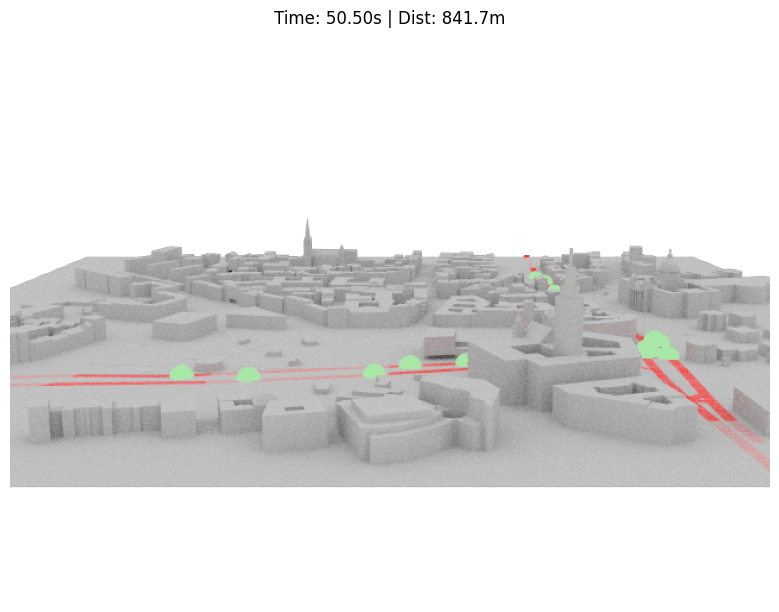

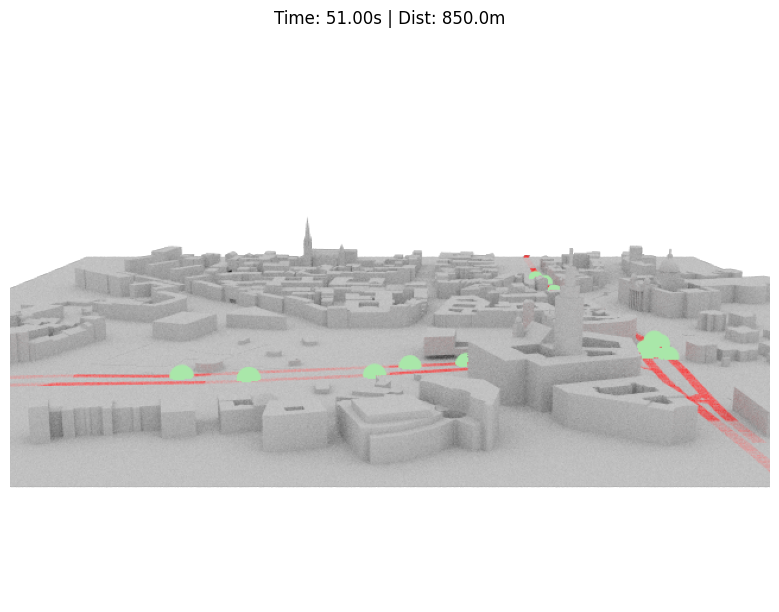

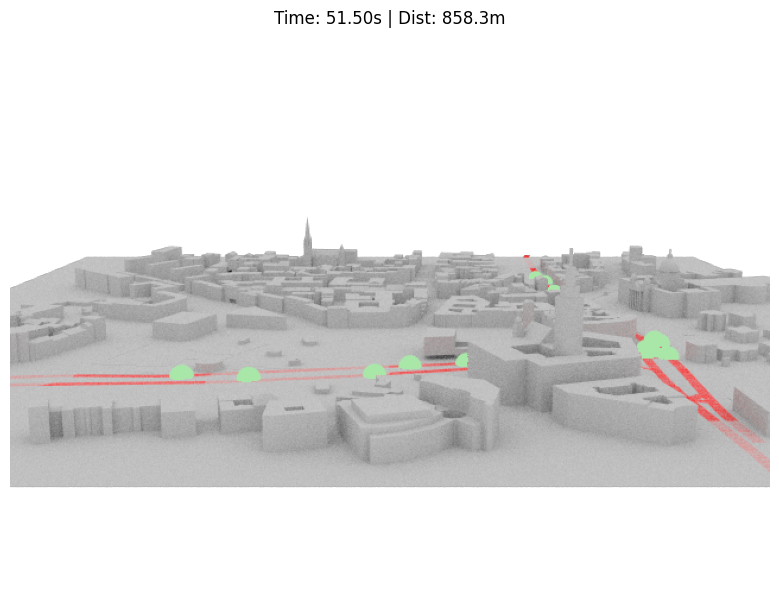

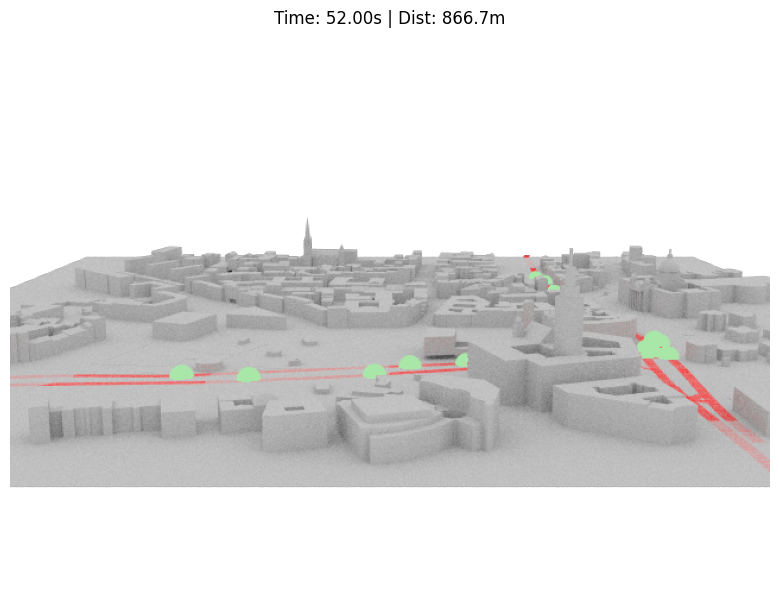

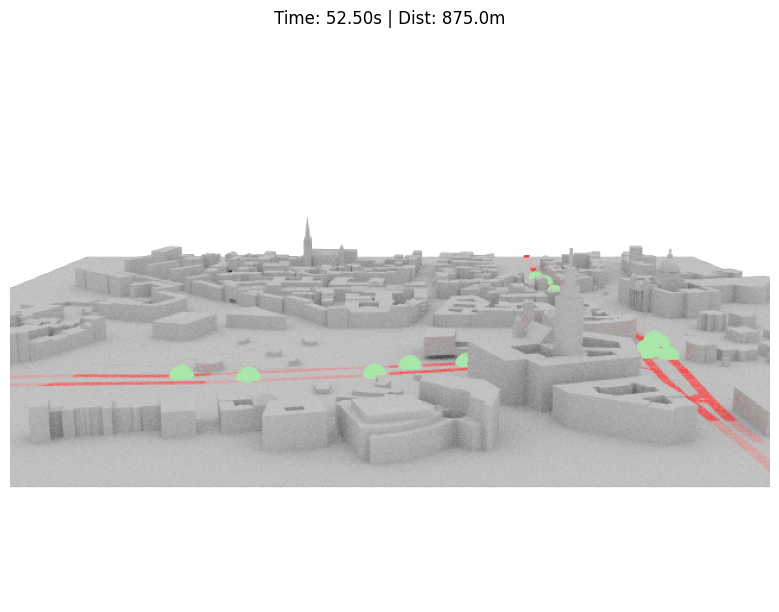

...

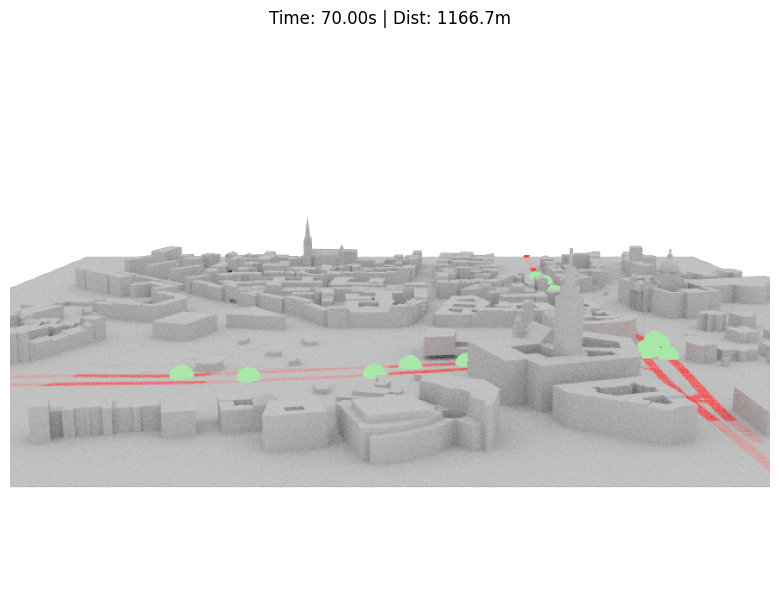

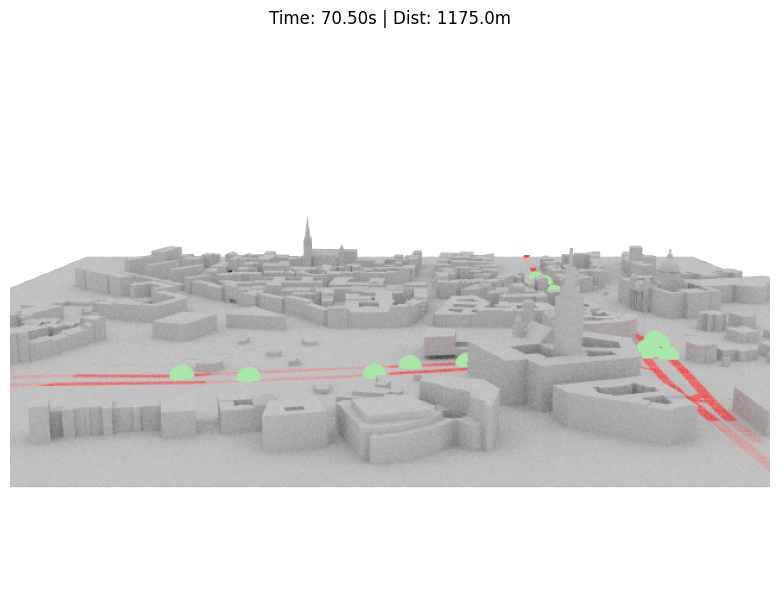

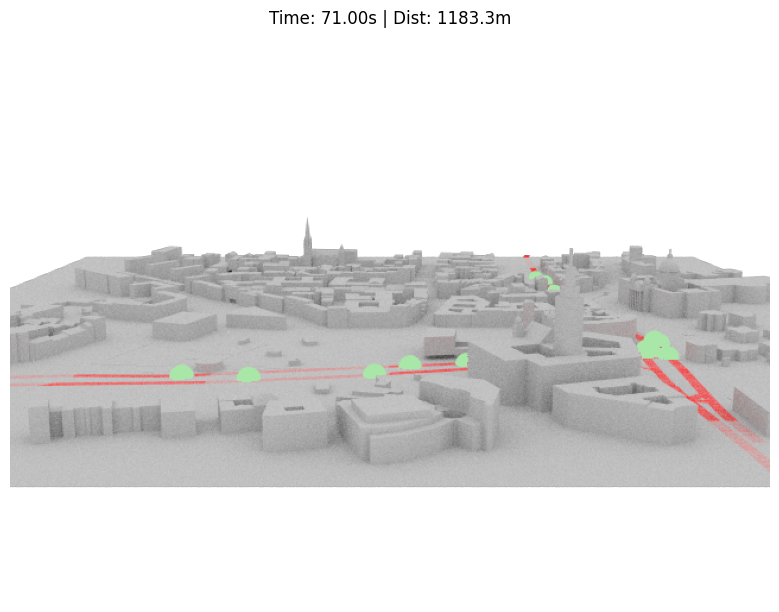

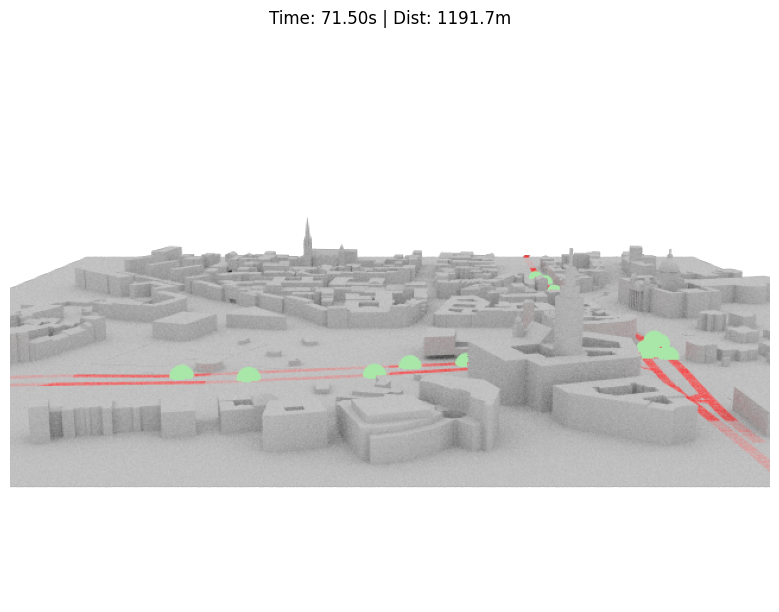

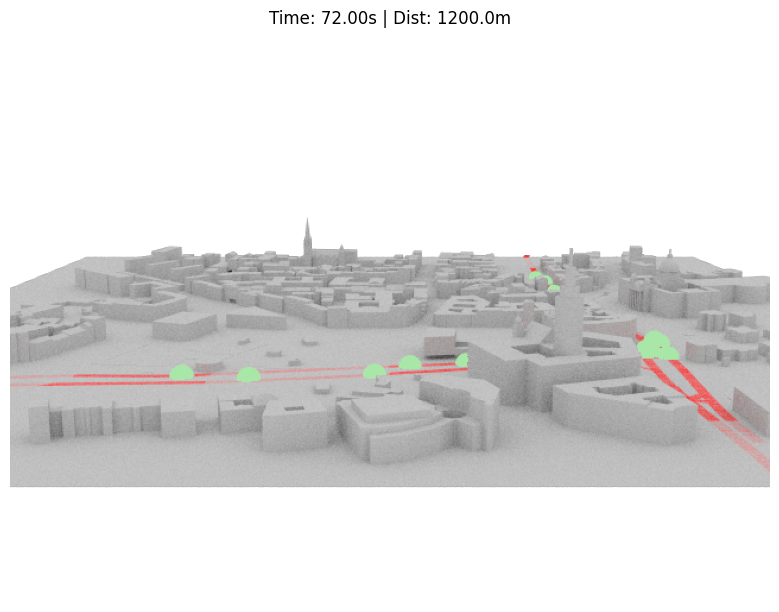

In [11]:
import numpy as np
import mitsuba as mi
from sionna.rt import Transmitter, PlanarArray, load_scene, Camera
import os
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# 0. 사전 준비 (기존 데이터 확인)
# ---------------------------------------------------------
# road_positions 변수와 scene 변수가 메모리에 로드되어 있어야 합니다.
if 'road_positions' not in globals() or len(road_positions) == 0:
    print("[Error] 'road_positions' 데이터가 없습니다. 도로 좌표 추출 코드를 먼저 실행해주세요.")
    # 실행을 중단하려면 여기서 raise SystemExit 등을 사용할 수 있습니다.

# ---------------------------------------------------------
# 1. 경로 및 시뮬레이션 환경 설정
# ---------------------------------------------------------

# 기존에 배치된 모든 차량(송신기) 제거 (차량 1대만 남기기 위함)
if hasattr(scene, 'transmitters'):
    for tx_name in list(scene.transmitters.keys()):
        scene.remove(tx_name)
    print("[Info] 기존 차량을 모두 제거했습니다.")

# 경로 인덱스
path_indices = [
    412, 410, 408, 406, 404, 401, 400, 72, 69, 68, 342, 340, 338, 335, 334, 
    88, 86, 84, 81, 464, 462, 459, 295, 370, 294, 368, 366, 363, 308, 306, 
    303, 302, 514, 511, 510, 488, 483, 482, 172, 269, 292, 288, 286, 284, 
    281, 604, 601, 507, 289, 506, 268, 522, 517, 516, 122, 120, 117, 116, 
    525, 582
]

# 경로 좌표 추출 및 높이 보정
waypoints = road_positions[path_indices]
waypoints[:, 2] += 1.5 

# 누적 거리 계산 (보간법 사용을 위함)
diffs = waypoints[1:] - waypoints[:-1]
segment_dists = np.linalg.norm(diffs, axis=1)
cumulative_dists = np.concatenate(([0], np.cumsum(segment_dists)))
total_distance = cumulative_dists[-1]

print(f"[Simulation Info]")
print(f"  - Total Distance: {total_distance:.2f} m")

# 속도 설정 (60 km/h)
speed_kmh = 60.0
speed_ms = speed_kmh * 1000 / 3600 
total_time = total_distance / speed_ms

print(f"  - Speed: {speed_kmh} km/h ({speed_ms:.2f} m/s)")
print(f"  - Total Time: {total_time:.2f} s")

# ---------------------------------------------------------
# 2. 이동 로직 함수
# ---------------------------------------------------------
def get_location_at_distance(dist):
    dist = np.clip(dist, 0, total_distance)
    
    # 현재 거리가 속한 구간(Index) 찾기
    idx = np.searchsorted(cumulative_dists, dist) - 1
    idx = max(0, min(idx, len(waypoints) - 2))
    
    seg_start_dist = cumulative_dists[idx]
    seg_length = segment_dists[idx]
    
    if seg_length == 0:
        return waypoints[idx], np.zeros(3)

    # 선형 보간 (Linear Interpolation)
    ratio = (dist - seg_start_dist) / seg_length
    current_pos = waypoints[idx] + ratio * (waypoints[idx+1] - waypoints[idx])
    
    # 방향 벡터 계산 (속도 벡터용)
    direction = (waypoints[idx+1] - waypoints[idx]) / seg_length
    velocity = direction * speed_ms
    
    return current_pos, velocity

# ---------------------------------------------------------
# 3. 송신기 배치 및 카메라 설정 (수정됨)
# ---------------------------------------------------------

# 파란색 자동차(송신기) 1대 초기화
tx_name = "Blue_Car_Tx"
start_pos = waypoints[0].tolist()

# 안테나 패턴 설정 (없을 경우 대비)
scene.tx_array = PlanarArray(num_rows=1, num_cols=1, pattern="iso", polarization="V")

tx = Transmitter(name=tx_name, 
                 position=start_pos, 
                 orientation=[0,0,0],
                 color=[0.0, 0.0, 1.0]) # 파란색 설정
scene.add(tx)
print(f"[Info] 차량 배치 완료: {tx_name}")

# 결과 저장 폴더 생성
output_dir = "sim_frames"
os.makedirs(output_dir, exist_ok=True)

# [핵심 수정] 카메라 설정: Z축을 반대편(-1000)으로 뒤집음
# 기존: [0, 200, 1000] -> 수정: [0, 200, -1000]
# look_at은 [0, 0, 0]을 유지하여 원점을 바라보게 함
cam = Camera(position=[0, 200, -1000], look_at=[0, 0, 0]) 

# ---------------------------------------------------------
# 4. 시뮬레이션 루프
# ---------------------------------------------------------
delta_t = 0.5  # 0.5초 단위
current_time = 0.0
frame_idx = 0

print("\n[Starting Simulation... Saving frames]")

while current_time <= total_time:
    # 1. 위치 계산 및 업데이트
    current_dist = speed_ms * current_time
    pos, vel = get_location_at_distance(current_dist)
    
    # Sionna 객체 위치 업데이트
    tx.position = pos.tolist()
    tx.velocity = vel.tolist()

    # 2. 렌더링 및 이미지 저장
    try:
        # 해상도 조절 (필요시 resolution=[1280, 720] 등으로 변경 가능)
        fig = scene.render(camera=cam, num_samples=64, resolution=[640, 480])
        
        if fig:
            ax = fig.gca()
            ax.set_title(f"Time: {current_time:.2f}s | Dist: {current_dist:.1f}m")
            
            filename = os.path.join(output_dir, f"frame_{frame_idx:04d}.png")
            fig.savefig(filename, bbox_inches='tight')
            plt.close(fig) # 메모리 해제
            
            print(f"  Saved frame {frame_idx}: T={current_time:.1f}s")
        else:
            print(f"  [Warning] Frame {frame_idx} render failed.")

    except Exception as e:
        print(f"  [Error] Failed to render frame {frame_idx}: {e}")
    
    current_time += delta_t
    frame_idx += 1

print(f"\n[Done] All frames saved in '{output_dir}' folder.")

[Simulation Info]
  - Total Dist: 1200.79 m
  - Total Time: 72.05 s

[Info] 기지국 4개 배치 중...
  -> BaseStation_0: [448.2762  30.      25.    ]
  -> BaseStation_1: [300.89908  30.       25.     ]
  -> BaseStation_2: [-128.50803   30.        25.     ]
  -> BaseStation_3: [-191.64143   30.        25.     ]

[Start Channel Sounding...]
  T=  0.0s | Dist=   0.0m | Best RSRP=-63.81 dBm (BS_0)
  T=  0.5s | Dist=   8.3m | Best RSRP=-63.68 dBm (BS_0)
  T=  1.0s | Dist=  16.7m | Best RSRP=-63.55 dBm (BS_0)
  T=  1.5s | Dist=  25.0m | Best RSRP=-63.42 dBm (BS_0)
  T=  2.0s | Dist=  33.3m | Best RSRP=-63.31 dBm (BS_0)
  T=  2.5s | Dist=  41.7m | Best RSRP=-68.88 dBm (BS_4)
  T=  3.0s | Dist=  50.0m | Best RSRP=-68.76 dBm (BS_8)
  T=  3.5s | Dist=  58.3m | Best RSRP=-68.64 dBm (BS_6)
  T=  4.0s | Dist=  66.7m | Best RSRP=-69.31 dBm (BS_3)
  T=  4.5s | Dist=  75.0m | Best RSRP=-69.20 dBm (BS_6)
  T=  5.0s | Dist=  83.3m | Best RSRP=-69.08 dBm (BS_3)
  T=  5.5s | Dist=  91.7m | Best RSRP=-68.96 dBm (BS_

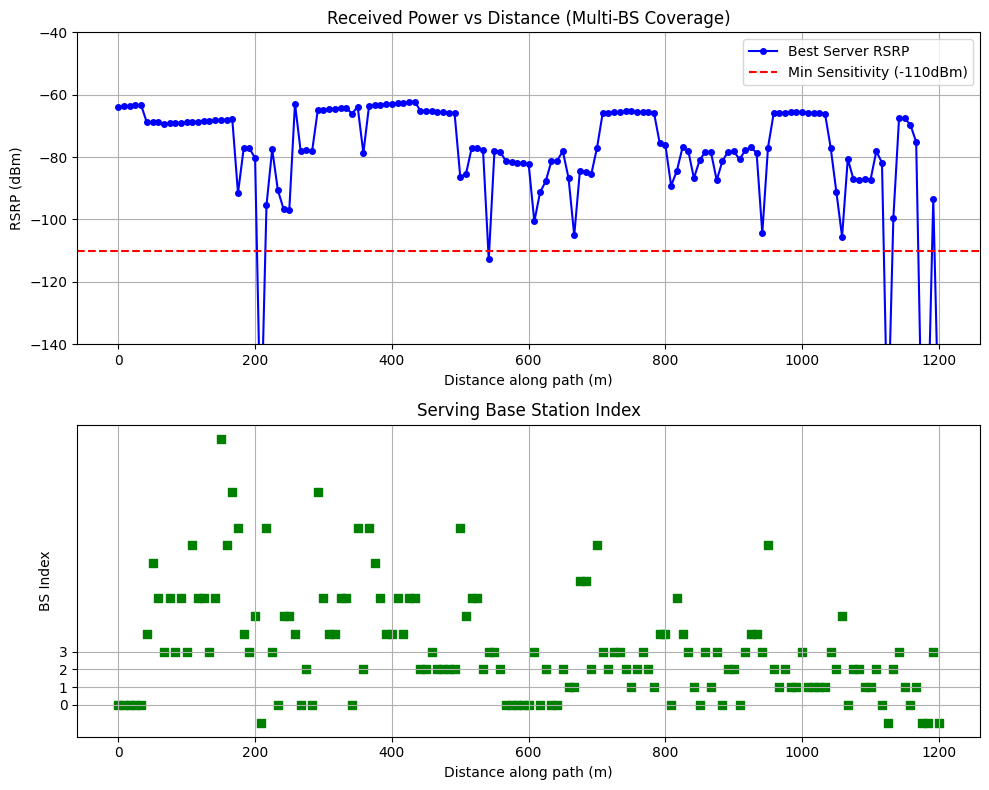

[Saved] 'result_multi_bs_sounding.png'


In [12]:
import numpy as np
import mitsuba as mi
import matplotlib.pyplot as plt
import os
import drjit as dr
from sionna.rt import Transmitter, Receiver, PlanarArray, load_scene, Camera, PathSolver

# ---------------------------------------------------------
# 0. 데이터 및 환경 초기화
# ---------------------------------------------------------
xml_path = "/data1/mh/sionna/src/sionna/rt/scenes/kookmin/kookmin_itu.xml"
scene = load_scene(xml_path)

if 'road_positions' not in globals() or len(road_positions) == 0:
    raise ValueError("[Error] 'road_positions' 데이터가 없습니다. 좌표 추출 코드를 먼저 실행하세요.")

# 객체 초기화
if hasattr(scene, 'transmitters'):
    for k in list(scene.transmitters.keys()): scene.remove(k)
if hasattr(scene, 'receivers'):
    for k in list(scene.receivers.keys()): scene.remove(k)

# ---------------------------------------------------------
# 1. 이동 경로 및 속도 설정 (기존과 동일)
# ---------------------------------------------------------
path_indices = [
    412, 410, 408, 406, 404, 401, 400, 72, 69, 68, 342, 340, 338, 335, 334, 
    88, 86, 84, 81, 464, 462, 459, 295, 370, 294, 368, 366, 363, 308, 306, 
    303, 302, 514, 511, 510, 488, 483, 482, 172, 269, 292, 288, 286, 284, 
    281, 604, 601, 507, 289, 506, 268, 522, 517, 516, 122, 120, 117, 116, 
    525, 582
]

max_valid_idx = len(road_positions) - 1
valid_path = [i for i in path_indices if i <= max_valid_idx]
waypoints = road_positions[valid_path]
waypoints[:, 2] += 1.5 

diffs = waypoints[1:] - waypoints[:-1]
segment_dists = np.linalg.norm(diffs, axis=1)
cumulative_dists = np.concatenate(([0], np.cumsum(segment_dists)))
total_distance = cumulative_dists[-1]

speed_ms = 60.0 * 1000 / 3600
total_time = total_distance / speed_ms

print(f"[Simulation Info]")
print(f"  - Total Dist: {total_distance:.2f} m")
print(f"  - Total Time: {total_time:.2f} s")

def get_location_at_distance(dist):
    dist = np.clip(dist, 0, total_distance)
    idx = np.searchsorted(cumulative_dists, dist) - 1
    idx = max(0, min(idx, len(waypoints) - 2))
    seg_start = cumulative_dists[idx]
    seg_len = segment_dists[idx]
    if seg_len == 0: return waypoints[idx], np.zeros(3)
    ratio = (dist - seg_start) / seg_len
    pos = waypoints[idx] + ratio * (waypoints[idx+1] - waypoints[idx])
    direction = (waypoints[idx+1] - waypoints[idx]) / seg_len
    vel = direction * speed_ms
    return pos, vel

# ---------------------------------------------------------
# 2. 다중 기지국(Tx 4개) 및 차량(Rx) 배치
# ---------------------------------------------------------
scene.tx_array = PlanarArray(num_rows=1, num_cols=1, pattern="iso", polarization="V")
scene.rx_array = PlanarArray(num_rows=1, num_cols=1, pattern="iso", polarization="V")

# [수정] 기지국 4개를 경로상에 등간격으로 배치
num_bs = 4
bs_indices = np.linspace(0, len(waypoints)-1, num_bs, dtype=int)

print(f"\n[Info] 기지국 {num_bs}개 배치 중...")
for i, idx in enumerate(bs_indices):
    pos = waypoints[idx].copy()
    # 도로변 건물 옥상 느낌으로 위치 조정
    pos[0] += 30.0  # 도로 옆 30m
    pos[1] += 30.0
    pos[2] = 25.0   # 높이 25m
    
    tx_name = f"BaseStation_{i}"
    tx = Transmitter(name=tx_name, position=pos.tolist(), orientation=[0,0,0])
    scene.add(tx)
    print(f"  -> {tx_name}: {pos}")

# 차량 배치
rx_name = "Car_Rx"
start_pos = waypoints[0].tolist()
rx = Receiver(name=rx_name, 
              position=start_pos, 
              orientation=[0,0,0], 
              color=[0.0, 0.0, 1.0]) 
scene.add(rx)

# ---------------------------------------------------------
# 3. PathSolver
# ---------------------------------------------------------
solver = PathSolver() 

# ---------------------------------------------------------
# 4. 시뮬레이션 루프
# ---------------------------------------------------------
delta_t = 0.5 
current_time = 0.0

history = {
    "time": [],
    "distance": [],
    "power_dbm": [], # Best Server RSRP
    "serving_cell": [] # 어떤 기지국에 연결되었는지
}

output_dir = "sim_frames_sounding"
os.makedirs(output_dir, exist_ok=True)
cam = Camera(position=[0, 200, -1000], look_at=[0, 0, 0])

print("\n[Start Channel Sounding...]")

frame_idx = 0
while current_time <= total_time:
    current_dist = speed_ms * current_time
    pos, vel = get_location_at_distance(current_dist)
    
    rx.position = pos.tolist()
    rx.velocity = vel.tolist()
    
    # 초기화
    best_power_dbm = -170.0
    best_bs_idx = -1
    
    try:
        paths = solver(
            scene,
            max_depth=3,
            samples_per_src=int(1e5),
            specular_reflection=True, 
            diffraction=False,
            diffuse_reflection=False
        )
        
        if paths.a is not None:
            a_np = np.array(paths.a)
            # a_np shape: [Rx(1), Tx(4), Paths(M), RxAnt(1), TxAnt(1)] 
            # -> squeeze로 불필요한 차원 제거 -> [4, M] (기지국 4개, 각 경로들)
            
            # [수정] 각 기지국별 수신 전력 계산
            # axis=-1 (경로들)에 대해 파워 합산
            # paths.a의 차원은 보통 [Target, Source, Path, ...] 순서임.
            # 여기서는 Target=1(Rx), Source=4(Tx)
            
            # [1, 4, M, 1, 1] 형태라고 가정하고 계산
            # 각 Tx(Source)별로 에너지 합산 (Non-coherent sum)
            tx_powers_linear = np.sum(np.abs(a_np)**2, axis=2) # 결과 shape: [1, 4, 1, 1]
            tx_powers_linear = tx_powers_linear.flatten()      # 결과 shape: [4]
            
            # 가장 센 신호 찾기 (Best Server Selection)
            best_bs_idx = np.argmax(tx_powers_linear)
            max_linear = tx_powers_linear[best_bs_idx]
            
            if max_linear > 1e-20:
                best_power_dbm = 10 * np.log10(max_linear) + 30
            else:
                best_power_dbm = -170.0
                best_bs_idx = -1 # No service
                
    except Exception as e:
        print(f"[Err] {e}")

    # 기록
    history["time"].append(current_time)
    history["distance"].append(current_dist)
    history["power_dbm"].append(best_power_dbm)
    history["serving_cell"].append(best_bs_idx)
    
    bs_str = f"BS_{best_bs_idx}" if best_bs_idx != -1 else "None"
    print(f"  T={current_time:5.1f}s | Dist={current_dist:6.1f}m | Best RSRP={best_power_dbm:6.2f} dBm ({bs_str})")
    
    current_time += delta_t
    frame_idx += 1

print("[Done] Simulation Finished.")

# ---------------------------------------------------------
# 5. 결과 그래프
# ---------------------------------------------------------
plt.figure(figsize=(10, 8))

# RSRP 그래프
plt.subplot(2, 1, 1)
plt.plot(history["distance"], history["power_dbm"], 'b-o', markersize=4, label='Best Server RSRP')
plt.axhline(y=-110, color='r', linestyle='--', label='Min Sensitivity (-110dBm)')
plt.title("Received Power vs Distance (Multi-BS Coverage)")
plt.xlabel("Distance along path (m)")
plt.ylabel("RSRP (dBm)")
plt.legend()
plt.grid(True)
plt.ylim(bottom=-140, top=-40)

# 연결된 기지국 ID 그래프 (Handover 확인용)
plt.subplot(2, 1, 2)
plt.scatter(history["distance"], history["serving_cell"], c='green', marker='s')
plt.title("Serving Base Station Index")
plt.xlabel("Distance along path (m)")
plt.ylabel("BS Index")
plt.yticks(range(num_bs))
plt.grid(True)

plt.tight_layout()
plt.savefig("result_multi_bs_sounding.png")
plt.show()
print("[Saved] 'result_multi_bs_sounding.png'")

Sionna 라이브러리를 사용하여 OFDM 시스템을 구성하고, 송신 신호가 Rayleigh 페이딩 채널을 통과한 후 수신단에서 LS(Least Squares) 기법으로 채널을 추정하는 과정

In [13]:
import tensorflow as tf
import numpy as np
# sionna 라이브러리가 설치되어 있어야 합니다.
try:
    import sionna
    from sionna.phy.ofdm import ResourceGrid, ResourceGridMapper, LSChannelEstimator
    from sionna.phy.channel import RayleighBlockFading, GenerateOFDMChannel, ApplyOFDMChannel
    from sionna.phy.mapping import Constellation, Mapper, BinarySource
except ImportError:
    print("Sionna 라이브러리가 설치되지 않았습니다. 'pip install sionna'를 실행해주세요.")
    exit()

# 1. 시스템 파라미터 설정
num_ofdm_symbols = 14
fft_size = 64
subcarrier_spacing = 30e3
num_tx = 1
num_streams_per_tx = 1
num_rx = 1
num_rx_ant = 1
batch_size = 64

# 2. 리소스 그리드 생성 (파일럿 패턴 포함)
# [cite_start]ResourceGrid 내에서 pilot_pattern="kronecker"를 설정하여 내부적으로 패턴을 생성하도록 합니다[cite: 4054].
rg = ResourceGrid(
    num_ofdm_symbols=num_ofdm_symbols,
    fft_size=fft_size,
    subcarrier_spacing=subcarrier_spacing,
    num_tx=num_tx,
    num_streams_per_tx=num_streams_per_tx,
    pilot_pattern="kronecker", 
    pilot_ofdm_symbol_indices=[2, 11]
)

# 3. 채널 추정기 (LS Estimator) 설정
# [cite_start]LSChannelEstimator는 수신 신호와 노이즈 분산을 입력받아 채널을 추정합니다[cite: 4147].
ls_est = LSChannelEstimator(
    resource_grid=rg,
    interpolation_type="nn"
)

# --- 시뮬레이션 흐름 ---

# (1) 데이터 생성 및 매핑
# QAM 심볼 생성
num_data_symbols = rg.num_data_symbols
# [cite_start]Constellation 객체 생성 [cite: 1531]
constellation = Constellation("qam", num_bits_per_symbol=2) # QPSK
# [cite_start]바이너리 데이터 생성 [cite: 1662]
b = BinarySource()([batch_size, num_tx, num_streams_per_tx, num_data_symbols * 2])
# [cite_start]매퍼를 통해 심볼로 변환 [cite: 1580]
mapper = Mapper(constellation=constellation)
x = mapper(b)

# [cite_start]리소스 그리드 매핑 (데이터와 파일럿을 그리드에 배치) [cite: 3816]
rg_mapper = ResourceGridMapper(rg)
x_rg = rg_mapper(x)

# (2) 채널 생성 및 적용 (OFDM Channel)
# [cite_start]Rayleigh Block Fading 채널 모델 설정 [cite: 2316]
rayleigh = RayleighBlockFading(
    num_rx=num_rx,
    num_rx_ant=num_rx_ant,
    num_tx=num_tx,
    num_tx_ant=1
)

# [cite_start]OFDM 채널 생성기 [cite: 2269]
generate_channel = GenerateOFDMChannel(
    channel_model=rayleigh,
    resource_grid=rg
)

# 채널 주파수 응답 생성 (h_freq)
h_freq = generate_channel(batch_size)

# 채널 적용 (y = h * x + n)
# [cite_start]ApplyOFDMChannel은 리스트가 아닌 개별 인자로 [x, h_freq, no]를 순서대로 받습니다[cite: 2286].
no = 0.01  # 노이즈 분산
channel_apply = ApplyOFDMChannel()

# [수정] 리스트 []를 제거하고 인자를 직접 전달
y = channel_apply(x_rg, h_freq, no) 

# (3) 채널 추정 수행
# [cite_start]LSChannelEstimator 역시 [y, no] 리스트가 아닌 y, no를 개별 인자로 받습니다[cite: 4147].
# [수정] 리스트 []를 제거하고 인자를 직접 전달
h_hat, err_var = ls_est(y, no)

# --- 결과 확인 ---
print("입력 채널 형태 (h_freq):", h_freq.shape)
print("추정 채널 형태 (h_hat):", h_hat.shape)

# 채널값 비교 (첫 번째 배치, 첫 번째 링크의 일부 데이터)
print("\n[원본 채널값 (Real part, 상위 5개)]")
print(tf.math.real(h_freq[0, 0, 0, 0, 0, 0, :5]).numpy())

print("\n[추정된 채널값 (Real part, 상위 5개)]")
print(tf.math.real(h_hat[0, 0, 0, 0, 0, 0, :5]).numpy())

# MSE(Mean Squared Error) 계산
mse = tf.reduce_mean(tf.abs(h_freq - h_hat)**2)
print(f"\nMean Squared Error (MSE): {mse:.6f}")

2025-12-12 14:14:20.849788: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1765516460.859259 1421557 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1765516460.862158 1421557 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1765516460.870804 1421557 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1765516460.870811 1421557 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1765516460.870813 1421557 computation_placer.cc:177] computation placer alr

입력 채널 형태 (h_freq): (64, 1, 1, 1, 1, 14, 64)
추정 채널 형태 (h_hat): (64, 1, 1, 1, 1, 14, 64)

[원본 채널값 (Real part, 상위 5개)]
[-2.0655947 -2.0655947 -2.0655947 -2.0655947 -2.0655947]

[추정된 채널값 (Real part, 상위 5개)]
[-2.0212362 -1.9571195 -2.0471795 -2.0212271 -2.018581 ]

Mean Squared Error (MSE): 0.010236


In [17]:
import numpy as np
import mitsuba as mi
import matplotlib.pyplot as plt
import os
import drjit as dr
from sionna.rt import Transmitter, Receiver, PlanarArray, load_scene, Camera, PathSolver

# ---------------------------------------------------------
# 0. 데이터 및 환경 초기화
# ---------------------------------------------------------
xml_path = "/data1/mh/sionna/src/sionna/rt/scenes/kookmin/kookmin_itu.xml"
scene = load_scene(xml_path)

if 'road_positions' not in globals() or len(road_positions) == 0:
    raise ValueError("[Error] 'road_positions' 데이터가 없습니다. 좌표 추출 코드를 먼저 실행하세요.")

# 객체 초기화
if hasattr(scene, 'transmitters'):
    for k in list(scene.transmitters.keys()): scene.remove(k)
if hasattr(scene, 'receivers'):
    for k in list(scene.receivers.keys()): scene.remove(k)

# ---------------------------------------------------------
# 1. 이동 경로 및 속도 설정 (기존과 동일)
# ---------------------------------------------------------
path_indices = [
    412, 410, 408, 406, 404, 401, 400, 72, 69, 68, 342, 340, 338, 335, 334, 
    88, 86, 84, 81, 464, 462, 459, 295, 370, 294, 368, 366, 363, 308, 306, 
    303, 302, 514, 511, 510, 488, 483, 482, 172, 269, 292, 288, 286, 284, 
    281, 604, 601, 507, 289, 506, 268, 522, 517, 516, 122, 120, 117, 116, 
    525, 582
]

max_valid_idx = len(road_positions) - 1
valid_path = [i for i in path_indices if i <= max_valid_idx]
waypoints = road_positions[valid_path]
waypoints[:, 2] += 1.5 

diffs = waypoints[1:] - waypoints[:-1]
segment_dists = np.linalg.norm(diffs, axis=1)
cumulative_dists = np.concatenate(([0], np.cumsum(segment_dists)))
total_distance = cumulative_dists[-1]

speed_ms = 60.0 * 1000 / 3600
total_time = total_distance / speed_ms

print(f"[Simulation Info]")
print(f"  - Total Time: {total_time:.2f} s")

def get_location_at_distance(dist):
    dist = np.clip(dist, 0, total_distance)
    idx = np.searchsorted(cumulative_dists, dist) - 1
    idx = max(0, min(idx, len(waypoints) - 2))
    seg_start = cumulative_dists[idx]
    seg_len = segment_dists[idx]
    if seg_len == 0: return waypoints[idx], np.zeros(3)
    ratio = (dist - seg_start) / seg_len
    pos = waypoints[idx] + ratio * (waypoints[idx+1] - waypoints[idx])
    direction = (waypoints[idx+1] - waypoints[idx]) / seg_len
    vel = direction * speed_ms
    return pos, vel

# ---------------------------------------------------------
# 2. 기지국(Tx) 및 차량(Rx) 배치
# ---------------------------------------------------------
scene.tx_array = PlanarArray(num_rows=1, num_cols=1, pattern="iso", polarization="V")
scene.rx_array = PlanarArray(num_rows=1, num_cols=1, pattern="iso", polarization="V")

# 기지국 1개 설치 (채널 분석을 위해 단일 Tx 권장)
mid_idx = len(waypoints) // 2
bs_pos = waypoints[mid_idx].copy()
bs_pos[0] += 50.0 
bs_pos[2] = 30.0 

tx_name = "BaseStation_Tx"
tx = Transmitter(name=tx_name, position=bs_pos.tolist(), orientation=[0,0,0])
scene.add(tx)

rx_name = "Car_Rx"
start_pos = waypoints[0].tolist()
rx = Receiver(name=rx_name, 
              position=start_pos, 
              orientation=[0,0,0], 
              color=[0.0, 0.0, 1.0]) 
scene.add(rx)

# ---------------------------------------------------------
# 3. PathSolver 설정
# ---------------------------------------------------------
solver = PathSolver() 

# ---------------------------------------------------------
# 4. 시뮬레이션 루프 (CIR 데이터 수집)
# ---------------------------------------------------------
delta_t = 0.5 
current_time = 0.0

# CIR 데이터를 저장할 리스트
# 각 스텝마다 (delays, amplitudes) 튜플을 저장합니다.
cir_history = []
time_history = []

print("\n[Start Channel Sounding... Collecting CIR]")

while current_time <= total_time:
    # 1. 이동
    current_dist = speed_ms * current_time
    pos, vel = get_location_at_distance(current_dist)
    
    rx.position = pos.tolist()
    rx.velocity = vel.tolist()
    
    try:
        # 2. 경로 계산
        paths = solver(
            scene,
            max_depth=3,
            samples_per_src=int(1e5),
            specular_reflection=True, 
            diffraction=False,
            diffuse_reflection=False
        )
        
        # 3. CIR 추출 (Sionna RT 1.0+ 방식)
        if paths.a is not None:
            # DrJit -> NumPy
            # paths.a shape: [Rx, RxAnt, Tx, TxAnt, Paths] -> flatten to [Paths]
            # paths.tau shape: [Rx, RxAnt, Tx, TxAnt, Paths] -> flatten to [Paths]
            
            # 1대1 통신이므로 불필요한 차원 제거하고 1차원 배열로 만듦
            amps = np.array(paths.a).flatten() 
            delays = np.array(paths.tau).flatten()
            
            # 유효한 경로(에너지가 있는 경로)만 필터링
            valid_mask = np.abs(amps) > 1e-20
            
            amps = amps[valid_mask]
            delays = delays[valid_mask]
            
            # 지연시간(delay) 기준 정렬 (시각화를 위해)
            sort_idx = np.argsort(delays)
            cir_history.append((delays[sort_idx], amps[sort_idx]))
            
            # 로그 출력 (가장 센 경로의 파워)
            if len(amps) > 0:
                max_pwr_dbm = 10 * np.log10(np.max(np.abs(amps)**2)) + 30
            else:
                max_pwr_dbm = -170.0
        else:
            cir_history.append((np.array([]), np.array([])))
            max_pwr_dbm = -170.0
            
    except Exception as e:
        print(f"[Err] {e}")
        cir_history.append((np.array([]), np.array([])))
        max_pwr_dbm = -170.0
    
    time_history.append(current_time)
    print(f"  T={current_time:5.1f}s | Max Path Power={max_pwr_dbm:6.2f} dBm | Paths={len(cir_history[-1][0])}")
    
    current_time += delta_t

print("[Done] Simulation Finished.")

# ---------------------------------------------------------
# 5. CIR 시각화 (Time-Variant Channel Response)
# ---------------------------------------------------------
# CIR을 이미지(Heatmap)로 표현하기 위해 데이터를 격자(Grid)로 변환합니다.

# (1) 데이터 전처리: Delay Binning
# 모든 시간대에서 관측된 최소/최대 지연시간 확인
all_delays = np.concatenate([d for d, a in cir_history if len(d) > 0])
if len(all_delays) == 0:
    print("유효한 경로가 없어 그래프를 그릴 수 없습니다.")
else:
    min_delay = np.min(all_delays)
    max_delay = np.max(all_delays)
    
    # Delay 축을 10ns(또는 적절한 값) 단위로 나눔
    delay_resolution = 10e-9 # 10ns
    num_bins = int((max_delay - min_delay) / delay_resolution) + 1
    
    # Heatmap 매트릭스 생성 [시간 x Delay]
    cir_heatmap = np.full((len(time_history), num_bins), -170.0) # 기본값 -170dBm (Noise)
    
    for t_idx, (delays, amps) in enumerate(cir_history):
        if len(delays) == 0: continue
        
        # 각 경로를 해당하는 Delay Bin에 매핑
        power_dbm = 10 * np.log10(np.abs(amps)**2) + 30
        
        bin_indices = ((delays - min_delay) / delay_resolution).astype(int)
        bin_indices = np.clip(bin_indices, 0, num_bins - 1)
        
        # 같은 Bin에 여러 경로가 겹치면 최대값 사용 (또는 합산)
        for b_idx, pwr in zip(bin_indices, power_dbm):
            if pwr > cir_heatmap[t_idx, b_idx]:
                cir_heatmap[t_idx, b_idx] = pwr

    # (2) 그래프 그리기
    plt.figure(figsize=(12, 8))
    
    # X축: Time, Y축: Delay, Color: Power
    # imshow는 y축이 위에서 아래로 그려지므로 origin='lower' 설정
    # aspect='auto'로 설정하여 시간축과 지연축 비율 자동 조정
    
    extent = [time_history[0], time_history[-1], min_delay*1e6, max_delay*1e6] # Delay in microseconds
    
    plt.imshow(cir_heatmap.T, aspect='auto', origin='lower', extent=extent, cmap='jet', vmin=-140, vmax=-60)
    
    plt.colorbar(label='Power (dBm)')
    plt.title("Time-Variant Channel Impulse Response (CIR Evolution)")
    plt.xlabel("Simulation Time (s)")
    plt.ylabel("Delay (µs)")
    
    plt.tight_layout()
    plt.savefig("cir_evolution_heatmap.png")
    plt.show()
    print("[Saved] 'cir_evolution_heatmap.png'")
    
    # (3) RMS Delay Spread 그래프 추가
    rms_ds_list = []
    for delays, amps in cir_history:
        if len(delays) > 0:
            pwr = np.abs(amps)**2
            total_pwr = np.sum(pwr)
            mean_delay = np.sum(pwr * delays) / total_pwr
            sq_delay = np.sum(pwr * delays**2) / total_pwr
            rms_ds = np.sqrt(sq_delay - mean_delay**2)
            rms_ds_list.append(rms_ds * 1e9) # ns 단위 변환
        else:
            rms_ds_list.append(0)
            
    plt.figure(figsize=(10, 5))
    plt.plot(time_history, rms_ds_list, 'g-')
    plt.title("RMS Delay Spread over Time")
    plt.xlabel("Time (s)")
    plt.ylabel("RMS Delay Spread (ns)")
    plt.grid(True)
    plt.savefig("rms_delay_spread.png")
    plt.show()
    print("[Saved] 'rms_delay_spread.png'")

[Simulation Info]
  - Total Time: 72.05 s

[Start Channel Sounding... Collecting CIR]
  T=  0.0s | Max Path Power=-170.00 dBm | Paths=0
  T=  0.5s | Max Path Power=-170.00 dBm | Paths=0
  T=  1.0s | Max Path Power=-170.00 dBm | Paths=0
  T=  1.5s | Max Path Power=-170.00 dBm | Paths=0
  T=  2.0s | Max Path Power=-170.00 dBm | Paths=0
  T=  2.5s | Max Path Power=-170.00 dBm | Paths=0
  T=  3.0s | Max Path Power=-170.00 dBm | Paths=0
  T=  3.5s | Max Path Power=-170.00 dBm | Paths=0
  T=  4.0s | Max Path Power=-170.00 dBm | Paths=0
  T=  4.5s | Max Path Power=-170.00 dBm | Paths=0
  T=  5.0s | Max Path Power=-170.00 dBm | Paths=0
  T=  5.5s | Max Path Power=-170.00 dBm | Paths=0
  T=  6.0s | Max Path Power=-170.00 dBm | Paths=0
  T=  6.5s | Max Path Power=-170.00 dBm | Paths=0
  T=  7.0s | Max Path Power=-170.00 dBm | Paths=0
  T=  7.5s | Max Path Power=-170.00 dBm | Paths=0
  T=  8.0s | Max Path Power=-170.00 dBm | Paths=0
  T=  8.5s | Max Path Power=-170.00 dBm | Paths=0
  T=  9.0s | M

ValueError: need at least one array to concatenate